In [1]:
import wget

url = "http://www.gb.nrao.edu/dysh/example_data/onoff-L/data/TGBT21A_501_11.raw.vegas.fits"

fname = wget.download(url)
print(fname)

  2% [..                                                                    ]  23732224 / 795479040

  5% [....                                                                  ]  47308800 / 795479040

  9% [......                                                                ]  72212480 / 795479040

 12% [........                                                              ]  96649216 / 795479040

 15% [..........                                                            ] 121241600 / 795479040

 18% [............                                                          ] 145866752 / 795479040

 21% [...............                                                       ] 170721280 / 795479040

 24% [.................                                                     ] 195354624 / 795479040

 27% [...................                                                   ] 219807744 / 795479040

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 55% [......................................                                ] 440926208 / 795479040

 58% [........................................                              ] 465551360 / 795479040

 61% [...........................................                           ] 490340352 / 795479040

 64% [.............................................                         ] 514826240 / 795479040

 67% [...............................................                       ] 539508736 / 795479040

 70% [.................................................                     ] 564084736 / 795479040

 73% [...................................................                   ] 588603392 / 795479040

 77% [.....................................................                 ] 613105664 / 795479040

 80% [........................................................              ] 637771776 / 795479040

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 99% [..................................................................... ] 791330816 / 795479040

100% [......................................................................] 795479040 / 795479040

TGBT21A_501_11.raw.vegas (1).fits


In [2]:
from dysh.fits.gbtfitsload import GBTFITSLoad

In [3]:
sdfits = GBTFITSLoad(fname)

In [4]:
sdfits.summary(show_index=True)

,SCAN,OBJECT,VELOCITY,PROC,PROCSEQN,RESTFREQ,DOPFREQ,# IF,# POL,# INT,# FEED,AZIMUTH,ELEVATIO
0,152,NGC2415,3784.0,OnOff,1,1.617185,1.420406,5,2,151,1,286.218008,41.62843
1,153,NGC2415,3784.0,OnOff,2,1.617185,1.420406,5,2,151,1,286.886521,41.118134


In [25]:
psscan1 = sdfits.getps(152,ifnum=0,plnum=0)
psscan2 = sdfits.getps(scan=152,ifnum=0,plnum=0)

ta1 = psscan1.timeaverage(weights='tsys')
ta2 = psscan2.timeaverage(weights='tsys')


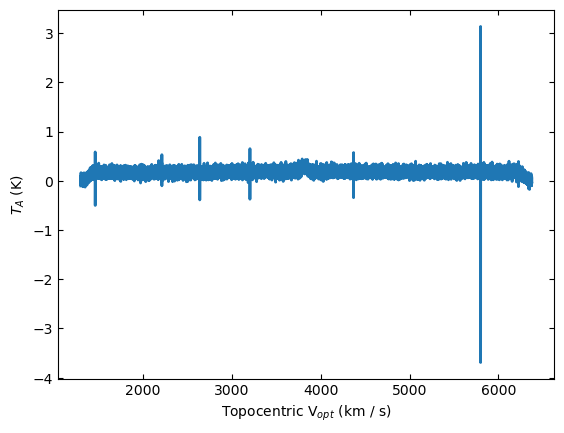

In [27]:
ta2.plot(xaxis_unit='km/s')

In [28]:

ta2.baseline(degree=2,exclude=[3600*kms,4100*kms],remove=True)

EXCLUDING [Spectral Region, 1 sub-regions:
  (1401242184.363393 Hz, 1403551474.1090915 Hz) 
]


 [astropy.modeling.fitting]


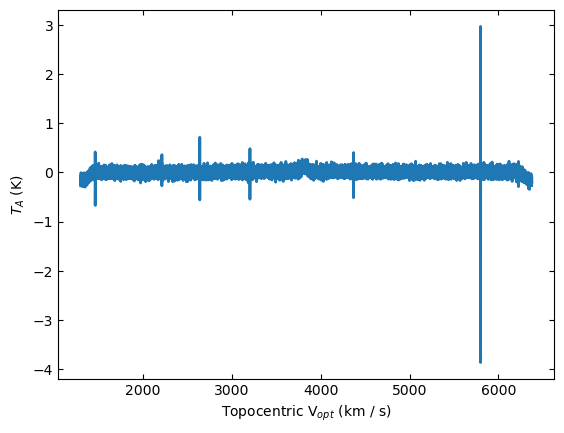

In [29]:
ta2.plot(xaxis_unit='km/s')

In [13]:
ta = psscan.timeaverage(weights='tsys')

In [16]:
ta1 ==ta2

False

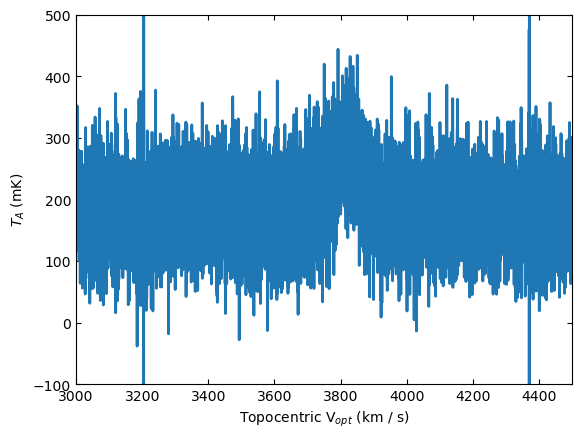

In [19]:
ta2.plot(xaxis_unit="km/s", yaxis_unit="mK", ymin=-100, ymax=500, xmin=3000, xmax=4500)

In [20]:
sdfits.info()

Filename: TGBT21A_501_11.raw.vegas (1).fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      12   ()      
  1  SINGLE DISH    1 BinTableHDU    245   6040R x 74C   ['32A', '1D', '22A', '1D', '1D', '1D', '32768E', '16A', '6A', '8A', '1D', '1D', '1D', '4A', '1D', '4A', '1D', '1I', '32A', '32A', '1J', '32A', '16A', '1E', '8A', '1D', '1D', '1D', '1D', '1D', '1D', '1D', '1D', '1D', '1D', '1D', '1D', '8A', '1D', '1D', '12A', '1I', '1I', '1D', '1D', '1I', '1A', '1I', '1I', '16A', '16A', '1J', '1J', '22A', '1D', '1D', '1I', '1A', '1D', '1E', '1D', '1D', '1D', '1D', '1D', '1A', '1A', '8A', '1E', '1E', '16A', '1I', '1I', '1I']   


In [21]:
import astropy.units as u

In [22]:
kms = u.km/u.s
ta2.baseline(degree=2,exclude=[3600*kms,4100*kms],remove=True)

EXCLUDING [Spectral Region, 1 sub-regions:
  (1401242184.363393 Hz, 1403551474.1090915 Hz) 
]


 [astropy.modeling.fitting]


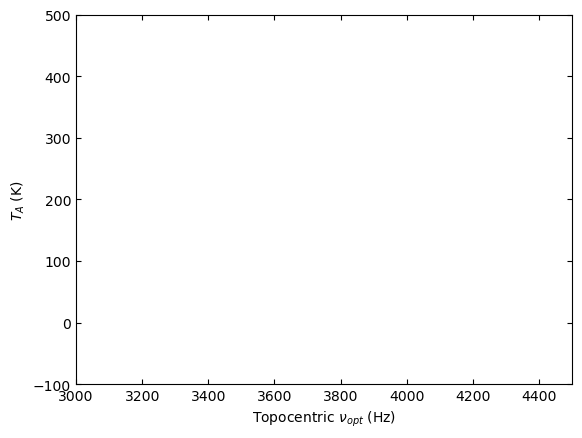

In [24]:
ta2.plot()

In [30]:
tpscan = sdfits.gettp(scan=152, ifnum=0, plnum=0)

In [34]:
print('%s' % (np.array2string(tpscan.nchan, precision=2)))

AttributeError: 'ScanBlock' object has no attribute '_nchan'

In [32]:
import numpy as np

In [35]:
tpscan

ScanBlock([<dysh.spectra.scan.TPScan at 0x7f205e9576d0>])

In [38]:
dir(tpscan)#.pols

['_UserList__cast',
 '__abstractmethods__',
 '__add__',
 '__class__',
 '__class_getitem__',
 '__contains__',
 '__copy__',
 '__delattr__',
 '__delitem__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__imul__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__mul__',
 '__ne__',
 '__new__',
 '__radd__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__reversed__',
 '__rmul__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_finalspectrum',
 '_npol',
 '_nrows',
 '_polaveraged',
 '_set_if_fd',
 '_timeaveraged',
 'append',
 'calibrate',
 'clear',
 'copy',
 'count',
 'data',
 'extend',
 'fdnum',
 'finalspectrum',
 'ifnum',
 'index',
 'insert',
 'nchan',
 'npol',
 'nrows',
 'polaverage',
 'pols',
 'pop',
 'remove',
 'reverse',
 'scan',
 'sort',
 'timeaverage']

In [40]:
ta2.tsys

AttributeError: 'Spectrum' object has no attribute 'tsys'

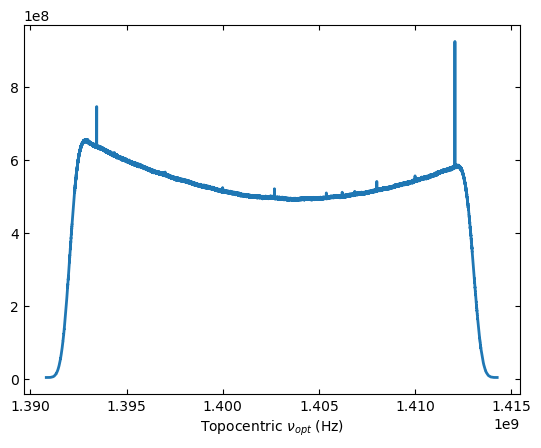

In [41]:
tpscan.timeaverage(weights=None).plot()

In [42]:
filename = wget.download("http://www.gb.nrao.edu/dysh/example_data/onoff-L/data/TGBT21A_501_11.raw.vegas.fits")
print(filename)

  2% [..                                                                    ]  23683072 / 795479040

  6% [....                                                                  ]  48308224 / 795479040

  9% [......                                                                ]  72933376 / 795479040

 12% [........                                                              ]  97353728 / 795479040

 15% [..........                                                            ] 121749504 / 795479040

 18% [............                                                          ] 146268160 / 795479040

 21% [...............                                                       ] 170762240 / 795479040

 24% [.................                                                     ] 195313664 / 795479040

 27% [...................                                                   ] 219791360 / 795479040

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 55% [......................................                                ] 440451072 / 795479040

 58% [........................................                              ] 465010688 / 795479040

 61% [...........................................                           ] 489504768 / 795479040

 64% [.............................................                         ] 514056192 / 795479040

 67% [...............................................                       ] 538550272 / 795479040

 70% [.................................................                     ] 563019776 / 795479040

 73% [...................................................                   ] 587694080 / 795479040

 76% [.....................................................                 ] 612270080 / 795479040

 80% [........................................................              ] 636755968 / 795479040

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



TGBT21A_501_11.raw.vegas (2).fits


In [43]:
sdfits=GBTFITSLoad(filename)

In [44]:
tpscan = sdfits.gettp(scan=152, ifnum=0, plnum=0)

In [45]:
print('%s' % (np.array2string(tpscan.tsys, precision=2)))

AttributeError: 'ScanBlock' object has no attribute 'tsys'

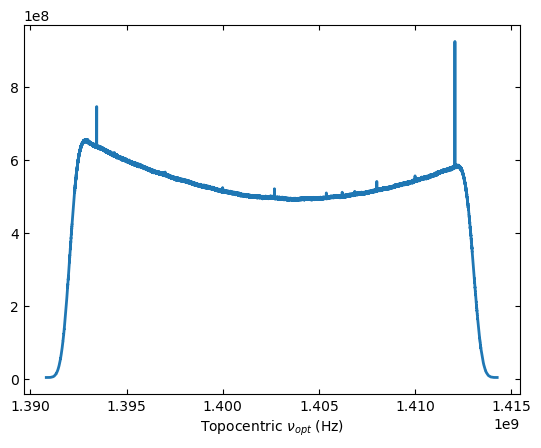

In [46]:
tpscan.timeaverage(weights=None).plot()

In [47]:
url = "http://www.gb.nrao.edu/dysh/example_data/subbeamnod-Ka/data/TRCO_230413_Ka.raw.vegas/TRCO_230413_Ka.raw.vegas.A.fits"
fname = wget.download(url)

 68% [.................................................                       ] 17170432 / 24955200

100% [........................................................................] 24955200 / 24955200

In [48]:
print(fname)

TRCO_230413_Ka.raw.vegas.A.fits


In [52]:
sdfits = GBTFITSLoad(fname)
sdfits.summary()

,SCAN,OBJECT,VELOCITY,PROC,PROCSEQN,RESTFREQ,DOPFREQ,# IF,# POL,# INT,# FEED,AZIMUTH,ELEVATIO
0,32,1256-0547,0.0,Nod,1,26.5,26.5,1,2,60,2,160.975324,43.884984
1,33,1256-0547,0.0,Nod,2,26.5,26.5,1,2,60,2,161.174093,43.928449
2,34,1256-0547,0.0,Nod,1,30.5,30.5,1,2,60,2,161.589629,44.000491
3,35,1256-0547,0.0,Nod,2,30.5,30.5,1,2,60,2,161.783395,44.041622
4,36,1256-0547,0.0,Unknown,0,0.75,0.75,1,2,120,2,162.124052,44.100404
5,37,1256-0547,0.0,Nod,1,34.5,34.5,1,2,60,2,162.611075,44.183661
6,38,1256-0547,0.0,Nod,2,34.5,34.5,1,2,60,2,162.896506,44.237997
7,39,1256-0547,0.0,Nod,1,37.5,37.5,1,2,60,2,163.333508,44.306385
8,40,1256-0547,0.0,Nod,2,37.5,37.5,1,2,60,2,163.529285,44.343704
9,41,1256-0547,0.0,Nod,1,30.5,30.5,1,2,60,2,164.941425,44.559629


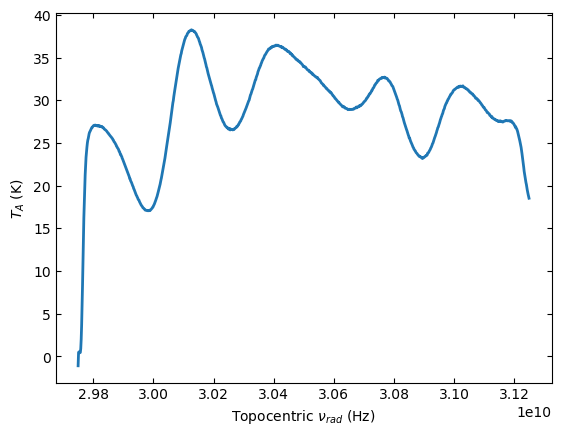

In [53]:
sbn = sdfits.subbeamnod(scan=43,fdnum=1,ifnum=0)
ta = sbn.timeaverage(weights='tsys')
ta.plot()